In [1]:
!python -m pip install -r requirements.txt
import os
import cv2
import torch
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from huggingface_hub import hf_hub_download

from torchvision import models, transforms

from segment_anything import (
    sam_model_registry,
    SamPredictor
)

  Cloning https://github.com/facebookresearch/segment-anything.git to C:\Users\aandr\AppData\Local\Temp\pip-req-build-3dti34z4
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git 'C:\Users\aandr\AppData\Local\Temp\pip-req-build-3dti34z4'


In [2]:
# Desactivar warning symlink
os.environ["HF_HUB_DISABLE_SYMLINKS_WARNING"] = "1"

# GPU o CPU
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Dispositivo:", DEVICE)

# Carpeta de imágenes
IMAGE_FOLDER = "../media/dataset"

# Crear carpetas de salida
os.makedirs("outputs", exist_ok=True)
os.makedirs("outputs/masks", exist_ok=True)
os.makedirs("outputs/overlays", exist_ok=True)

Dispositivo: cpu


In [3]:
checkpoint_path = hf_hub_download(
    repo_id="ybelkada/segment-anything",
    filename="checkpoints/sam_vit_h_4b8939.pth"
)

print("Checkpoint descargado en:")
print(checkpoint_path)

Checkpoint descargado en:
C:\Users\aandr\.cache\huggingface\hub\models--ybelkada--segment-anything\snapshots\7790786db131bcdc639f24a915d9f2c331d843ee\checkpoints\sam_vit_h_4b8939.pth


In [ ]:
sam = sam_model_registry["vit_h"](
    checkpoint=checkpoint_path
)

sam.to(device=DEVICE)

sam_predictor = SamPredictor(sam)

deeplab_model = models.segmentation.deeplabv3_resnet101(
    pretrained=True
).eval()

print("Modelos cargados")

c:\Users\aandr\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\aandr\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to C:\Users\aandr/.cache\torch\hub\checkpoints\deeplabv3_resnet101_coco-586e9e4e.pth


100%|██████████| 233M/233M [01:01<00:00, 3.97MB/s] 


Modelos cargados


In [5]:
CLASSES = [
    "background",
    "aeroplane",
    "bicycle",
    "bird",
    "boat",
    "bottle",
    "bus",
    "car",
    "cat",
    "chair",
    "cow",
    "diningtable",
    "dog",
    "horse",
    "motorbike",
    "person",
    "pottedplant",
    "sheep",
    "sofa",
    "train",
    "tvmonitor"
]

print("Número de categorías:", len(CLASSES))

Número de categorías: 21


In [6]:
preprocess = transforms.Compose([
    transforms.Resize(520),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
])

In [33]:
def random_color():
    return np.random.randint(0, 255, size=3)


def compute_metrics(binary_mask):

    binary_mask = binary_mask.astype(np.uint8)

    # Área
    area = np.sum(binary_mask)

    # Contornos
    contours, _ = cv2.findContours(
        binary_mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    perimeter = 0

    for cnt in contours:
        perimeter += cv2.arcLength(cnt, True)

    # Centroide
    M = cv2.moments(binary_mask)

    if M["m00"] != 0:
        cx = int(M["m10"] / M["m00"])
        cy = int(M["m01"] / M["m00"])
    else:
        cx, cy = 0, 0

    return {
        "area": area,
        "perimeter": perimeter,
        "centroid_x": cx,
        "centroid_y": cy
    }


def compute_iou(pred_mask):
    #Crear ground truth simulada
    kernel = np.ones((5,5), np.uint8)

    ground_truth = cv2.erode(
        pred_mask.astype(np.uint8),
        kernel,
        iterations=1
    ).astype(bool)

    intersection = np.logical_and(pred_mask, ground_truth)
    union = np.logical_or(pred_mask, ground_truth)

    return np.sum(intersection) / np.sum(union)

In [10]:
def deeplab_segmentation(image_path):

    image = Image.open(image_path).convert("RGB")

    tensor = preprocess(image).unsqueeze(0)

    with torch.no_grad():
        output = deeplab_model(tensor)["out"]

    prediction = output.argmax(1).squeeze().cpu().numpy()

    return np.array(image), prediction

In [11]:
image_files = [
    f for f in os.listdir(IMAGE_FOLDER)
    if f.endswith((".jpg", ".png", ".jpeg"))
]

print("Número de imágenes:", len(image_files))

Número de imágenes: 10


In [35]:
metrics_data = []

for image_name in image_files:

    print(f"\nProcesando: {image_name}")

    image_path = os.path.join(
        IMAGE_FOLDER,
        image_name
    )

    image_rgb, prediction = deeplab_segmentation(
        image_path
    )

    height, width = prediction.shape

    colored_mask = np.zeros(
        (height, width, 3),
        dtype=np.uint8
    )

    unique_classes = np.unique(prediction)

    # Procesar cada clase
    for cls_id in unique_classes:

        if cls_id == 0:
            continue

        class_mask = (prediction == cls_id)

        iou = compute_iou(class_mask)
        if iou < 0.75:
            print(f"Filtrando la clase {CLASSES[cls_id]} en imagen {image_name} por IoU ({iou}) < 0.75")
            continue

        color = random_color()

        colored_mask[class_mask] = color

        metrics = compute_metrics(class_mask)

        metrics["image"] = image_name
        metrics["class_id"] = int(cls_id)
        metrics["class_name"] = CLASSES[cls_id]

        metrics_data.append(metrics)

    # Overlay
    resized_original = cv2.resize(
        image_rgb,
        (width, height)
    )

    overlay = (
        0.6 * resized_original +
        0.4 * colored_mask
    ).astype(np.uint8)

    # Guardar resultados
    Image.fromarray(colored_mask).save(
        f"outputs/masks/{image_name}"
    )

    Image.fromarray(overlay).save(
        f"outputs/overlays/{image_name}"
    )

print("\nProcesamiento finalizado")


Procesando: imagen0.jpg
Filtrando la clase cat en imagen imagen0.jpg por IoU (0.6091205211726385) < 0.75

Procesando: imagen1.png

Procesando: imagen2.png

Procesando: imagen3.png

Procesando: imagen4.png
Filtrando la clase person en imagen imagen4.png por IoU (0.7065101387406617) < 0.75

Procesando: imagen5.png

Procesando: imagen6.png

Procesando: imagen7.png
Filtrando la clase chair en imagen imagen7.png por IoU (0.1956521739130435) < 0.75

Procesando: imagen8.png

Procesando: imagen9.png

Procesamiento finalizado


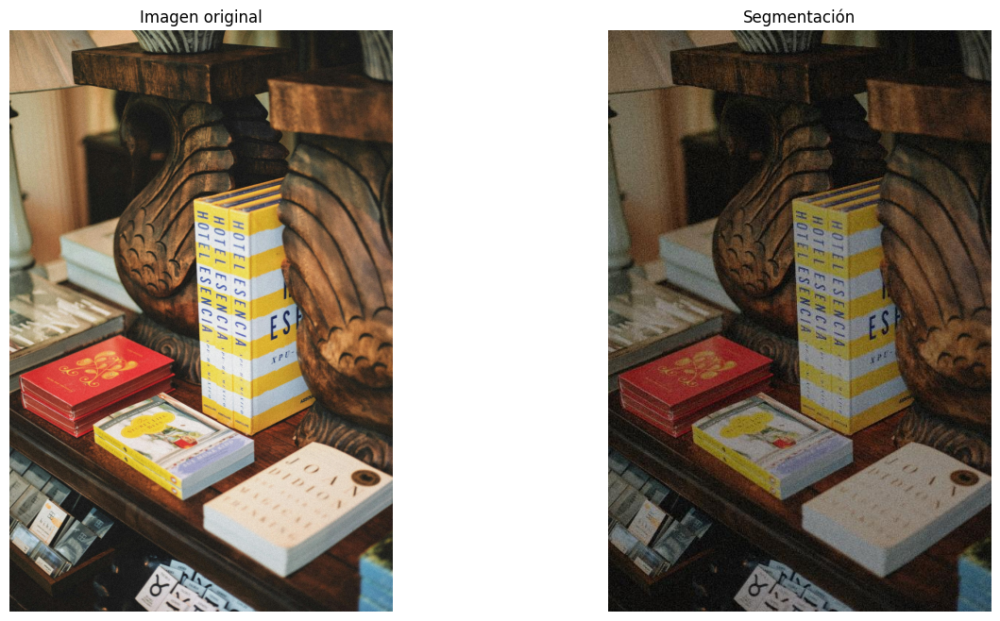

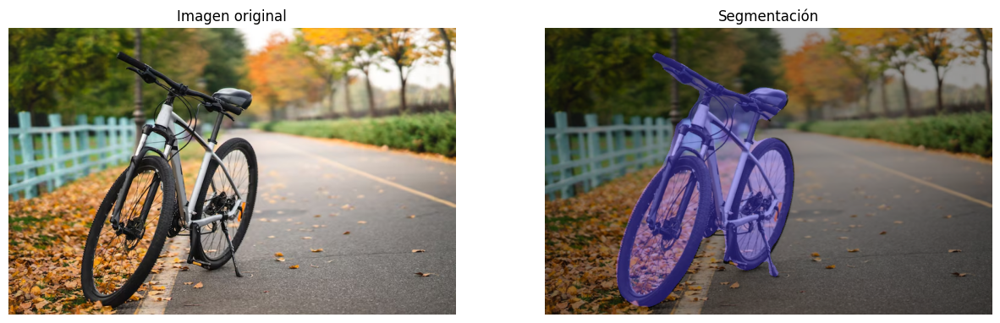

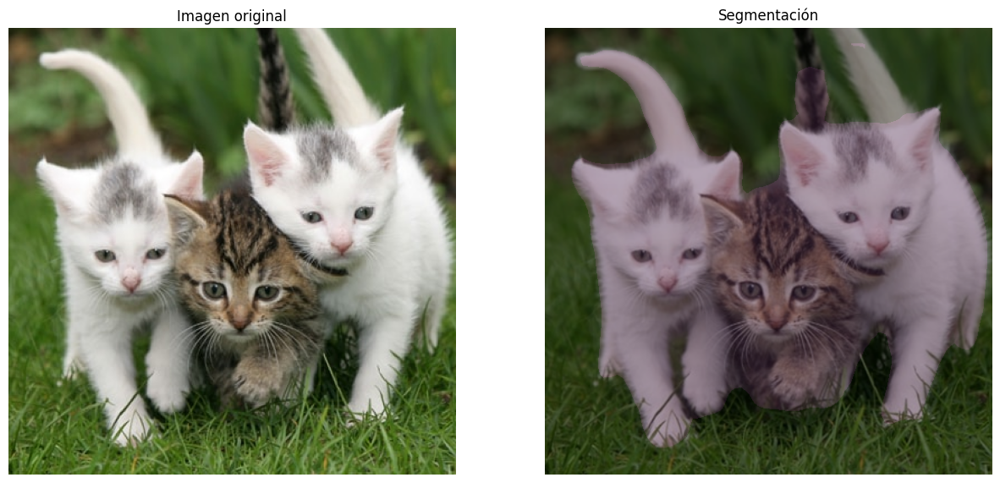

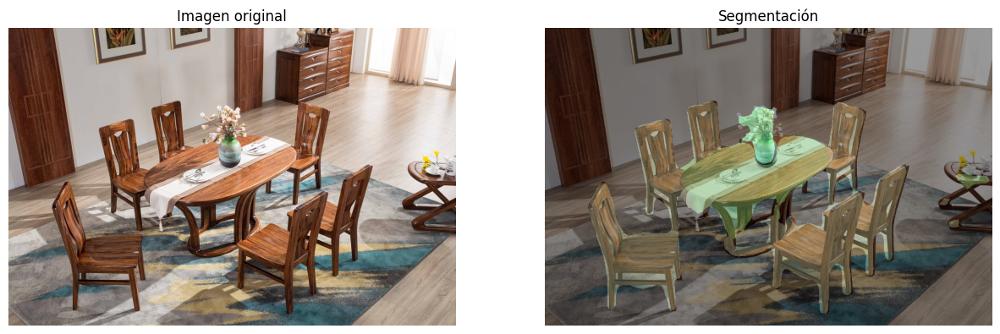

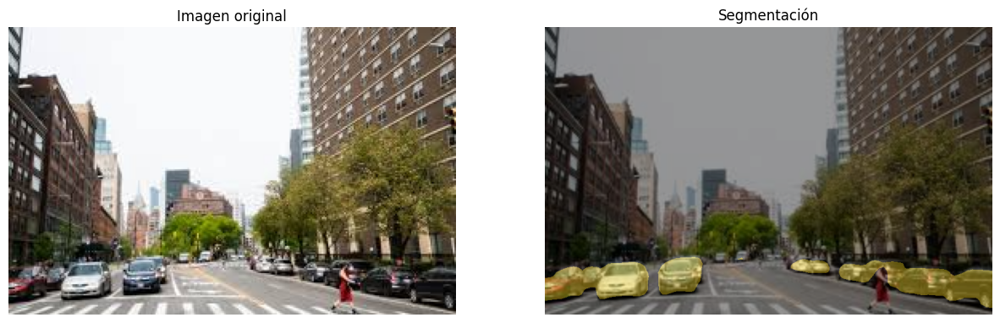

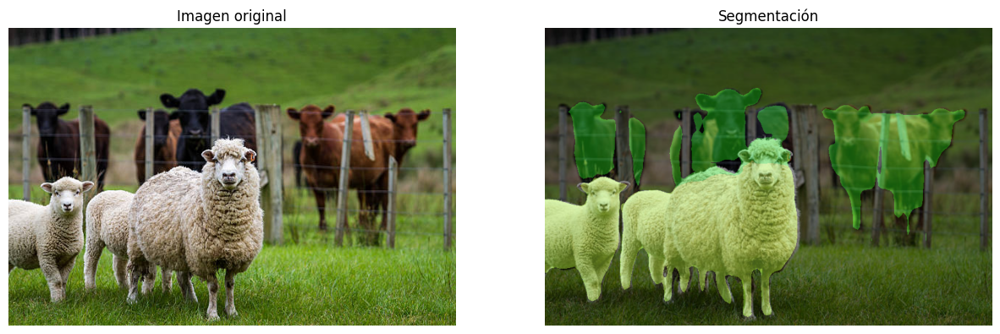

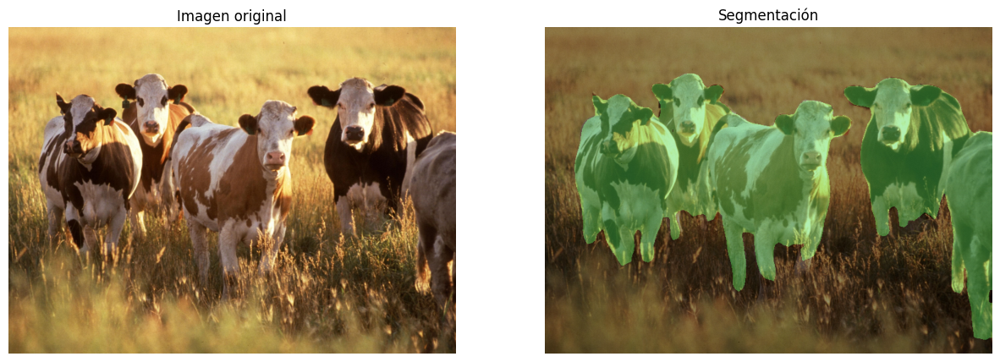

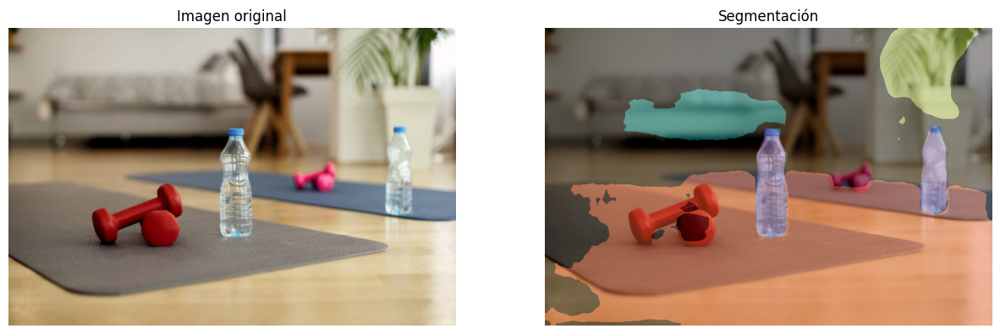

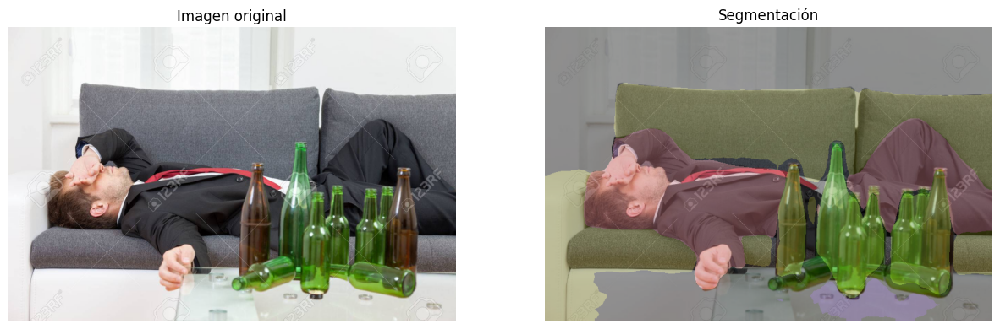

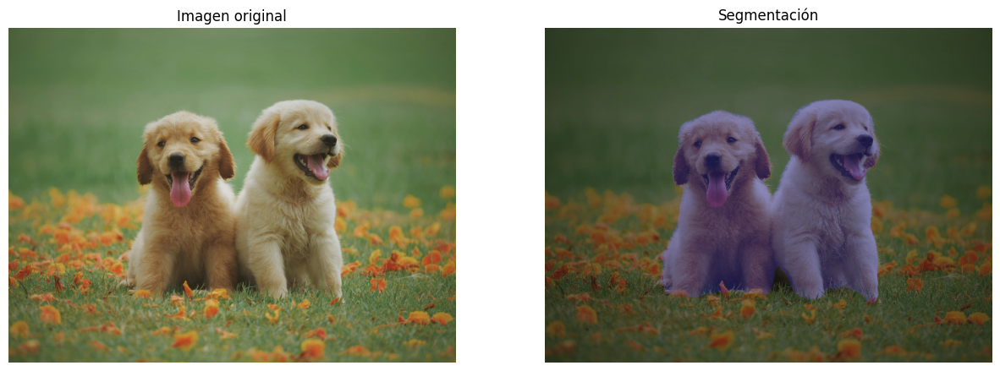

In [36]:
for sample_image in image_files:
    original = np.array(
        Image.open(
            os.path.join(
                IMAGE_FOLDER,
                sample_image
            )
        ).convert("RGB")
    )

    overlay = np.array(
        Image.open(
            f"outputs/overlays/{sample_image}"
        )
    )

    plt.figure(figsize=(15,8))
    ax = plt.subplot(1,2, 1)

    ax.imshow(original)
    ax.set_title("Imagen original")
    ax.axis("off")
    
    ax = plt.subplot(1,2, 2)

    ax.imshow(overlay)
    ax.set_title("Segmentación")
    ax.axis("off")
    plt.show()

In [14]:
metrics_df = pd.DataFrame(metrics_data)

metrics_df.head(20)

,area,perimeter,centroid_x,centroid_y,image,class_id,class_name
0,1842,326.391915,310,486,imagen0.jpg,8,cat
1,81264,1764.510877,295,295,imagen1.png,2,bicycle
2,140393,2422.736272,272,270,imagen2.png,8,cat
3,65146,3641.797236,353,324,imagen3.png,9,chair
4,24908,1039.359514,372,263,imagen3.png,11,diningtable
5,3974,311.965510,375,184,imagen3.png,16,pottedplant
6,27086,1690.330076,395,455,imagen4.png,7,car
7,1874,274.610172,617,458,imagen4.png,15,person
8,59106,3067.613469,417,205,imagen5.png,10,cow
9,71930,2403.089521,236,354,imagen5.png,17,sheep


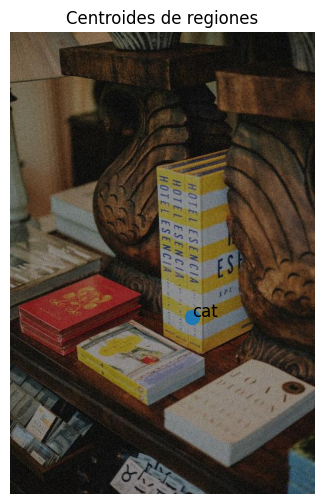

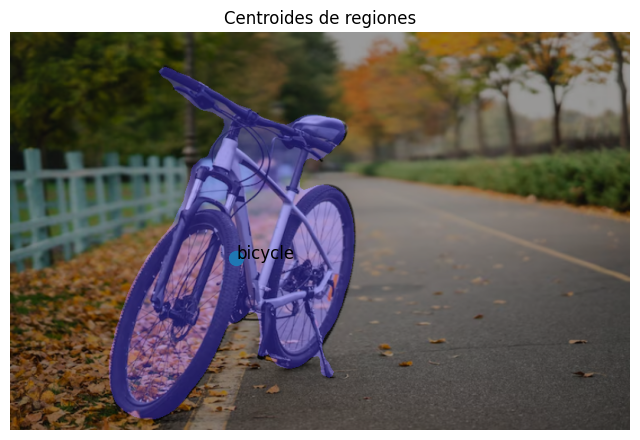

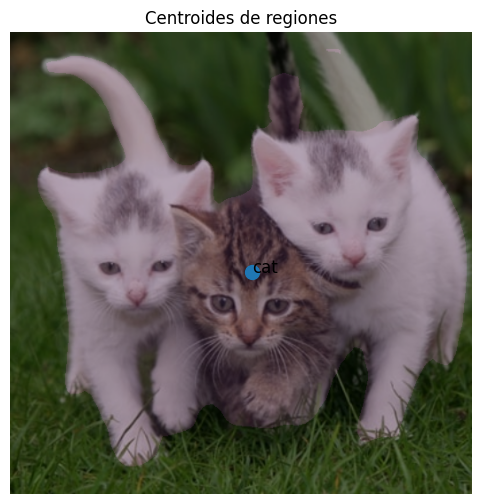

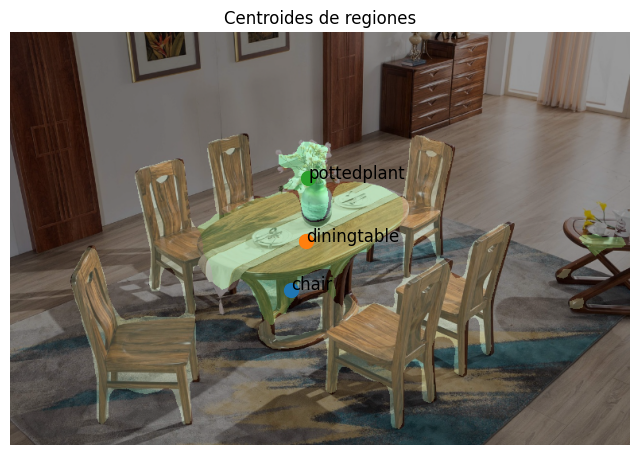

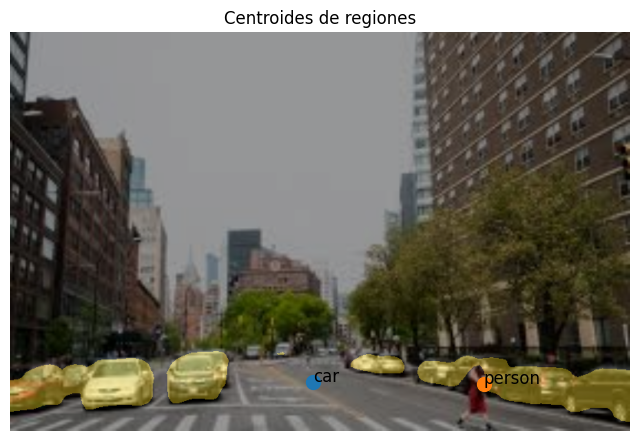

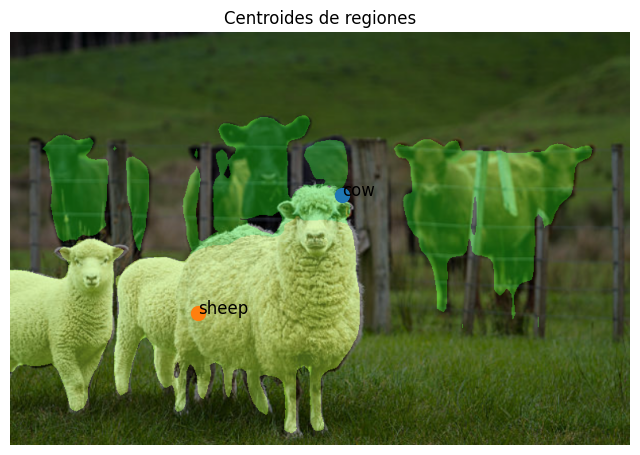

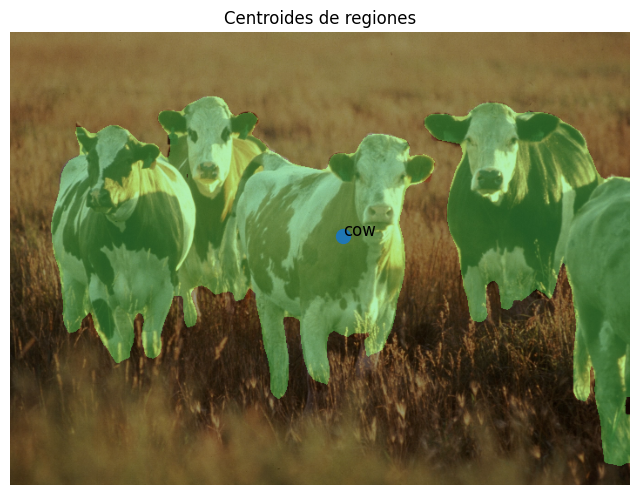

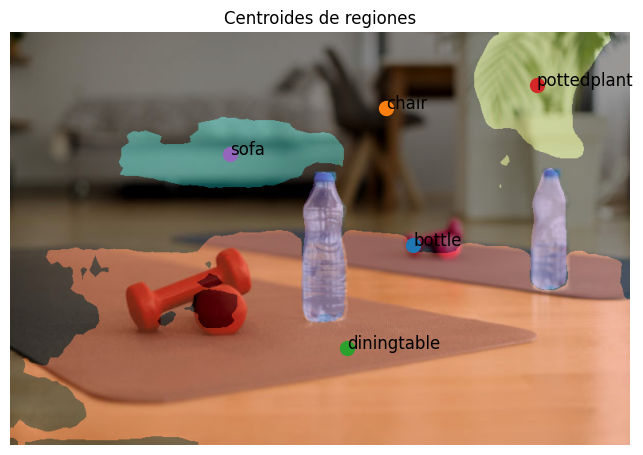

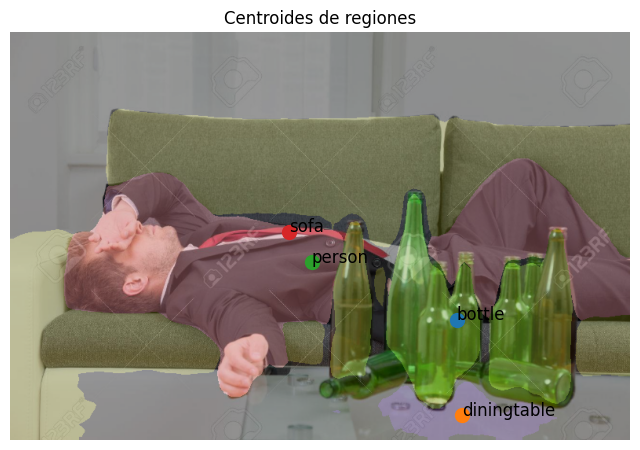

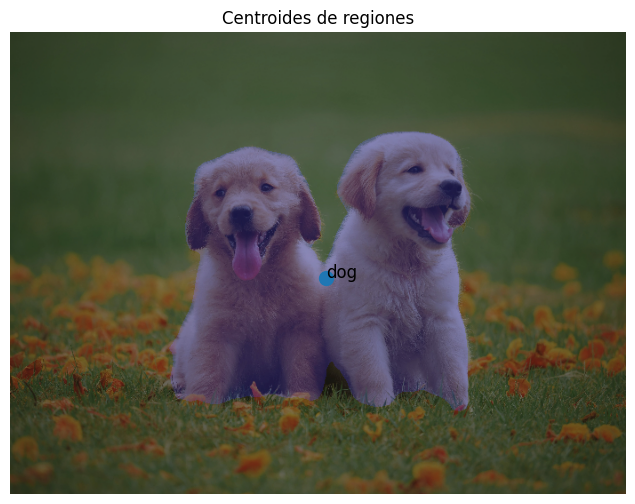

In [37]:
for sample_image in image_files:
    sample_metrics = metrics_df[
        metrics_df["image"] == sample_image
    ]

    overlay = np.array(
        Image.open(
            f"outputs/overlays/{sample_image}"
        )
    )

    plt.figure(figsize=(8,6))
    plt.imshow(overlay)

    for _, row in sample_metrics.iterrows():

        plt.scatter(
            row["centroid_x"],
            row["centroid_y"],
            s=100
        )

        plt.text(
            row["centroid_x"],
            row["centroid_y"],
            row["class_name"],
            fontsize=12
        )

    plt.title("Centroides de regiones")
    plt.axis("off")
    plt.show()